In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import gmean
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
import plotly.express as px

# Upload and Display
columns = [
    "Q-E", "ZN-E", "PH-E", "DBO-E", "DQO-E", "SS-E", "SSV-E", "SED-E", "COND-E",
    "PH-P", "DBO-P", "SS-P", "SSV-P", "SED-P", "COND-P",
    "PH-D", "DBO-D", "DQO-D", "SS-D", "SSV-D", "SED-D", "COND-D",
    "PH-S", "DBO-S", "DQO-S", "SS-S", "SSV-S", "SED-S", "COND-S",
    "RD-DBO-P", "RD-SS-P", "RD-SED-P", "RD-DBO-S", "RD-DQO-S",
    "RD-DBO-G", "RD-DQO-G", "RD-SS-G", "RD-SED-G"
]
url = "https://archive.ics.uci.edu/ml/machine-learning-databases/water-treatment/water-treatment.data"
df = pd.read_csv(url, names=columns, na_values=["?"])
df.head()

,Q-E,ZN-E,PH-E,DBO-E,DQO-E,SS-E,SSV-E,SED-E,COND-E,PH-P,...,COND-S,RD-DBO-P,RD-SS-P,RD-SED-P,RD-DBO-S,RD-DQO-S,RD-DBO-G,RD-DQO-G,RD-SS-G,RD-SED-G
D-1/3/90,44101.0,1.5,7.8,NaN,407.0,166.0,66.3,4.5,2110,7.9,...,2000.0,NaN,58.8,95.5,NaN,70.0,NaN,79.4,87.3,99.6
D-2/3/90,39024.0,3.0,7.7,NaN,443.0,214.0,69.2,6.5,2660,7.7,...,2590.0,NaN,60.7,94.8,NaN,80.8,NaN,79.5,92.1,100.0
D-4/3/90,32229.0,5.0,7.6,NaN,528.0,186.0,69.9,3.4,1666,7.7,...,1888.0,NaN,58.2,95.6,NaN,52.9,NaN,75.8,88.7,98.5
D-5/3/90,35023.0,3.5,7.9,205.0,588.0,192.0,65.6,4.5,2430,7.8,...,1840.0,33.1,64.2,95.3,87.3,72.3,90.2,82.3,89.6,100.0
D-6/3/90,36924.0,1.5,8.0,242.0,496.0,176.0,64.8,4.0,2110,7.9,...,2120.0,NaN,62.7,95.6,NaN,71.0,92.1,78.2,87.5,99.5


In [ ]:
# Missing Data Summary
print(" Dataset Shape ")
print(df.shape)

print("\n Missing Values per Column ")
print(df.isnull().sum()[df.isnull().sum() > 0])

print("\n Missing Data Percentage ")
print((df.isnull().sum() / len(df) * 100).sort_values(ascending=False))

 Dataset Shape 
(527, 38)

 Missing Values per Column 
Q-E         18
ZN-E         3
DBO-E       23
DQO-E        6
SS-E         1
SSV-E       11
SED-E       25
DBO-P       40
SSV-P       11
SED-P       24
DBO-D       28
DQO-D        9
SS-D         2
SSV-D       13
SED-D       25
PH-S         1
DBO-S       23
DQO-S       18
SS-S         5
SSV-S       17
SED-S       28
COND-S       1
RD-DBO-P    62
RD-SS-P      4
RD-SED-P    27
RD-DBO-S    40
RD-DQO-S    26
RD-DBO-G    36
RD-DQO-G    25
RD-SS-G      8
RD-SED-G    31
dtype: int64

 Missing Data Percentage 
RD-DBO-P    11.764706
DBO-P        7.590133
RD-DBO-S     7.590133
RD-DBO-G     6.831120
RD-SED-G     5.882353
DBO-D        5.313093
SED-S        5.313093
RD-SED-P     5.123340
RD-DQO-S     4.933586
RD-DQO-G     4.743833
SED-D        4.743833
SED-E        4.743833
SED-P        4.554080
DBO-E        4.364326
DBO-S        4.364326
Q-E          3.415560
DQO-S        3.415560
SSV-S        3.225806
SSV-D        2.466793
SSV-P        2.087287


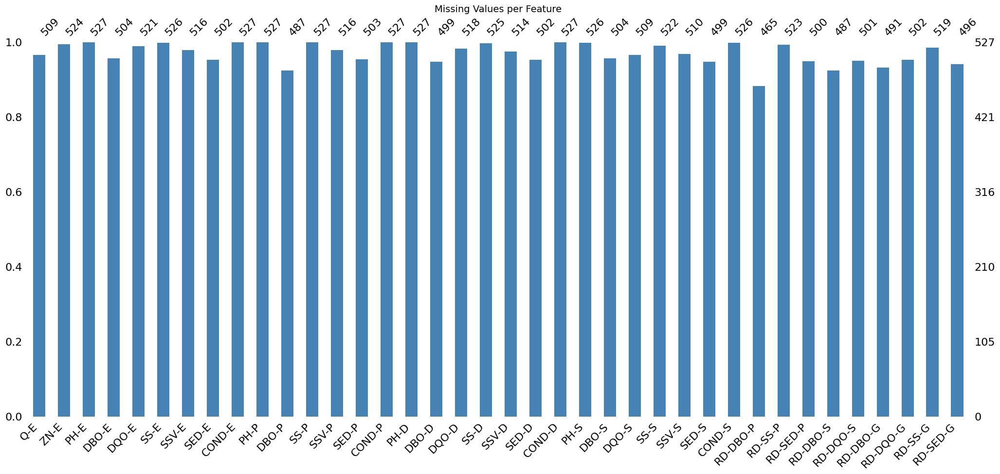

<Figure size 1200x600 with 0 Axes>

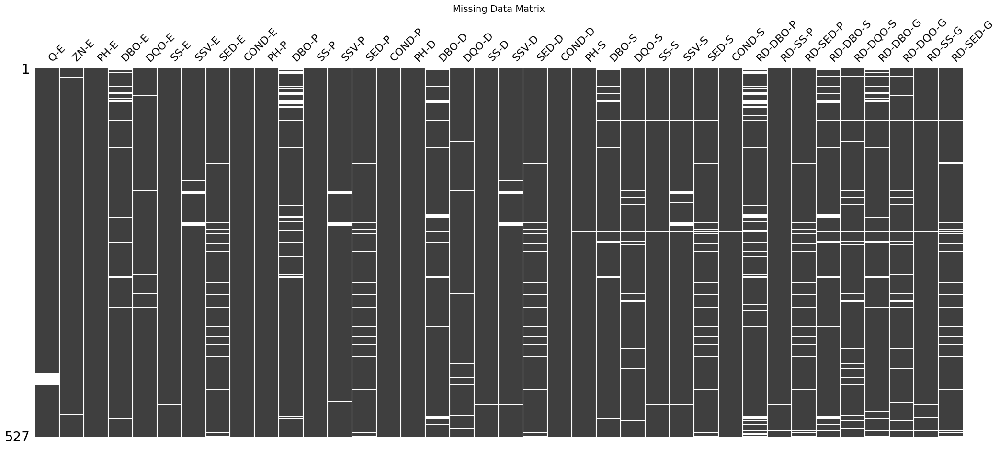

<Figure size 1200x600 with 0 Axes>

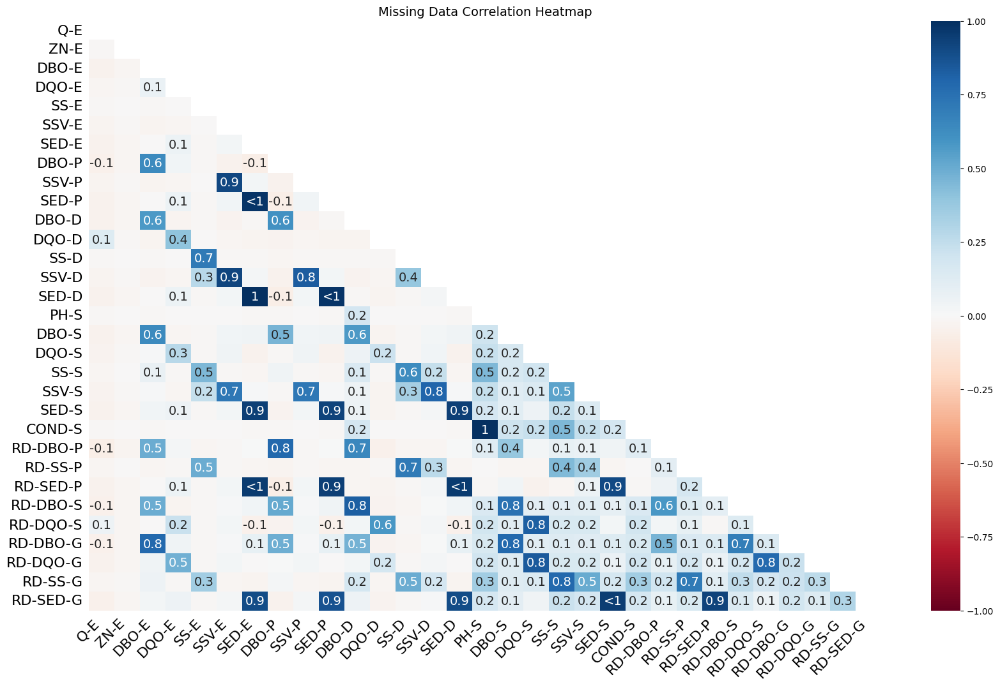

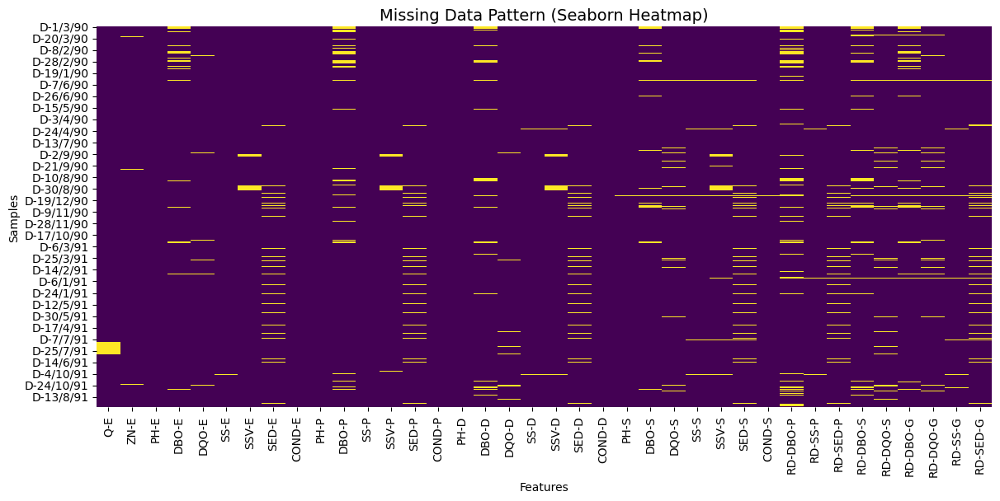

In [ ]:
# Missing Data Visualization
plt.figure(figsize=(12, 6))
msno.bar(df, color='steelblue')
plt.title("Missing Values per Feature", fontsize=14)
plt.show()

plt.figure(figsize=(12, 6))
msno.matrix(df, sparkline=False)
plt.title("Missing Data Matrix", fontsize=14)
plt.show()

plt.figure(figsize=(12, 6))
msno.heatmap(df)
plt.title("Missing Data Correlation Heatmap", fontsize=14)
plt.show()

plt.figure(figsize=(14, 6))
sns.heatmap(df.isnull(), cbar=False, cmap="viridis")
plt.title("Missing Data Pattern (Seaborn Heatmap)", fontsize=14)
plt.xlabel("Features")
plt.ylabel("Samples")
plt.show()

In [ ]:
print("\n Basic Stats ")
print(df.describe())

mean_vals = df.mean(numeric_only=True)
median_vals = df.median(numeric_only=True)
mode_vals = df.mode(numeric_only=True).iloc[0]
min_vals = df.min(numeric_only=True)
max_vals = df.max(numeric_only=True)
range_vals = max_vals - min_vals
var_vals = df.var(numeric_only=True)
std_vals = df.std(numeric_only=True)
geom_mean_vals = df.apply(
    lambda col: gmean(col.dropna()) if np.all(col.dropna() > 0) else np.nan,
    axis=0
)

summary_df = pd.DataFrame({
    "Count": df.count(numeric_only=True),
    "Mean": mean_vals,
    "Median": median_vals,
    "Mode": mode_vals,
    "Min": min_vals,
    "Max": max_vals,
    "Range": range_vals,
    "Variance": var_vals,
    "Std Dev": std_vals,
    "Geometric Mean": geom_mean_vals
})

print("\n Summary Table ")
print(summary_df)


 Basic Summary 
                Q-E        ZN-E        PH-E       DBO-E       DQO-E  \
count    509.000000  524.000000  527.000000  504.000000  521.000000   
mean   37226.567780    2.359065    7.810057  188.714286  406.898273   
std     6635.999806    2.749509    0.246175   62.062831  120.362974   
min    10050.000000    0.100000    6.900000   31.000000   81.000000   
25%    32888.000000    0.900000    7.600000  146.750000  325.000000   
50%    35990.000000    1.500000    7.800000  182.500000  400.000000   
75%    41372.000000    3.000000    8.000000  223.000000  478.000000   
max    60081.000000   33.500000    8.700000  438.000000  941.000000   

              SS-E       SSV-E       SED-E       COND-E        PH-P  ...  \
count   526.000000  516.000000  502.000000   527.000000  527.000000  ...   
mean    227.444867   61.393217    4.593825  1478.620493    7.829981  ...   
std     135.940589   12.415264    2.743947   394.898019    0.226925  ...   
min      98.000000   13.200000    0.400

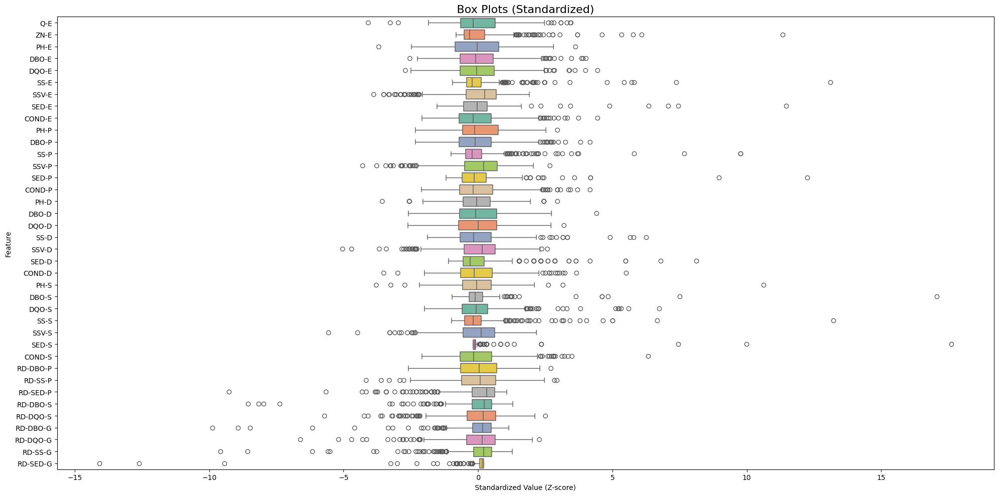

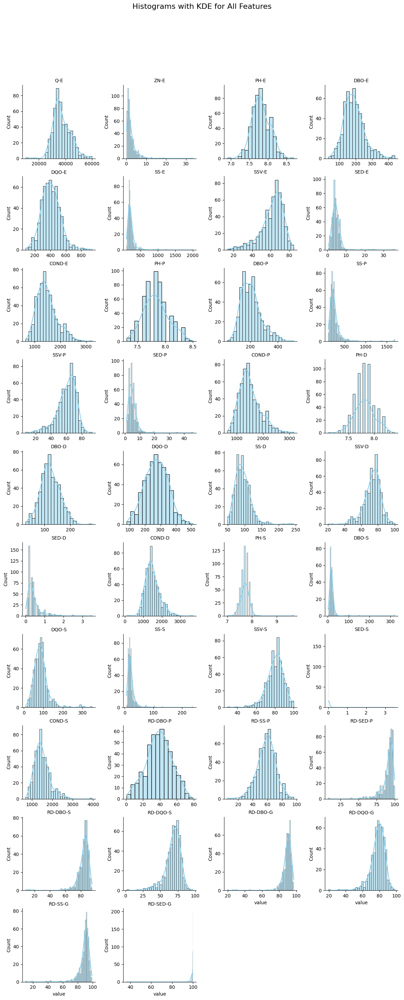

In [ ]:
# Scaled boxplots
scaler = StandardScaler()
scaled_df = pd.DataFrame(
    scaler.fit_transform(df.select_dtypes(include=[np.number])),
    columns=df.select_dtypes(include=[np.number]).columns)

plt.figure(figsize=(20, 10))
sns.boxplot(data=scaled_df, orient="h", palette="Set2")
plt.title("Box Plots (Standardized)", fontsize=16)
plt.xlabel("Standardized Value (Z-score)")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

# Histograms
df_long = df.melt(value_vars=df.select_dtypes(include='number').columns)
g = sns.FacetGrid(df_long, col="variable", col_wrap=4, sharex=False, sharey=False, height=3)
g.map(sns.histplot, "value", kde=True, color="skyblue", edgecolor="black")
g.set_titles("{col_name}")
plt.subplots_adjust(top=0.9)
g.fig.suptitle("Histograms with KDE for All Features", fontsize=16)
plt.show()

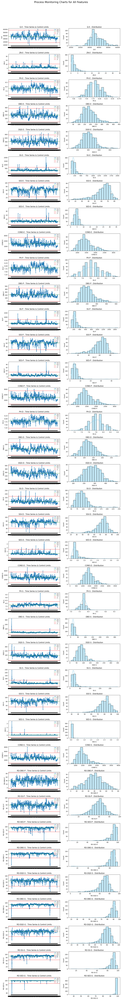

In [ ]:
# Process Monitoring Display
numeric_cols = df.select_dtypes(include=[np.number]).columns
fig, axes = plt.subplots(len(numeric_cols), 2, figsize=(12, len(numeric_cols)*2.5))
fig.suptitle("Process Monitoring Charts for All Features", fontsize=18, y=1.02)

for i, col in enumerate(numeric_cols):
    series = df[col].dropna()
    mean_val = series.mean()
    std_val = series.std()
    ucl = mean_val + 3*std_val
    lcl = mean_val - 3*std_val

    # Time-series with control limits
    ax1 = axes[i, 0]
    ax1.plot(series.index, series, marker='o', markersize=3, linestyle='-', label='Value')
    ax1.axhline(mean_val, color='green', linestyle='--', label='Mean')
    ax1.axhline(ucl, color='red', linestyle='--', label='+3σ')
    ax1.axhline(lcl, color='red', linestyle='--', label='-3σ')
    ax1.set_title(f"{col} - Time Series & Control Limits")
    ax1.set_ylabel(col)
    ax1.legend(loc='upper right', fontsize=6)

    # Histogram
    ax2 = axes[i, 1]
    sns.histplot(series, kde=True, bins=20, color="skyblue", edgecolor="black", ax=ax2)
    ax2.set_title(f"{col} - Distribution")
    ax2.set_xlabel(col)

plt.tight_layout()
plt.show()

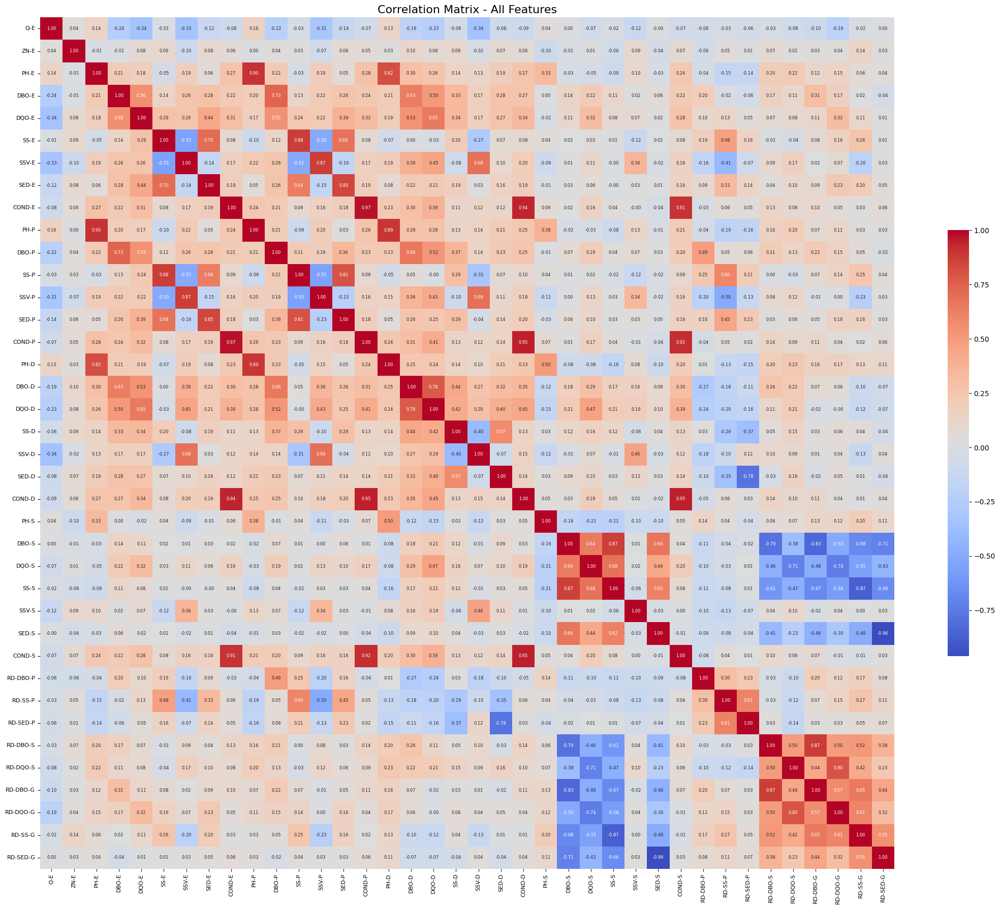

In [ ]:
# Correlation Matrix
corr = numeric_df.corr()

plt.figure(figsize=(22, 18))
sns.heatmap(
    corr,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    annot_kws={"size": 6},
    cbar_kws={"shrink": 0.5}
)
plt.xticks(rotation=90, fontsize=8)
plt.yticks(rotation=0, fontsize=8)
plt.title("Correlation Matrix - All Features", fontsize=16)
plt.tight_layout()
plt.show()

In [ ]:
# PairPlot
sns.pairplot(numeric_df, plot_kws={'s': 10, 'alpha': 0.6})
plt.suptitle("Pair Plot - All Features (Sampled Rows)", y=1.02)
plt.show()

In [ ]:
import plotly.express as px

# Limit number of dimensions per matrix page
max_dims_per_page = 8
columns = numeric_df.columns.tolist()

# Split into chunks of 8 features per matrix
for i in range(0, len(columns), max_dims_per_page):
    subset = columns[i:i + max_dims_per_page]
    fig = px.scatter_matrix(
        numeric_df,
        dimensions=subset,
        title=f"Scatter Matrix - Features {i+1} to {i+len(subset)}",
        height=900,
        width=900
    )
    fig.update_traces(diagonal_visible=True, marker=dict(size=3, opacity=0.6))
    fig.show()